# Creating Dataset

In [41]:
import warnings
warnings.filterwarnings('ignore')

In [42]:
from __future__ import absolute_import, division, print_function, unicode_literals

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import IPython.display as display

import glob
import os
import shutil

import tensorflow as tf
tf.__version__

'2.2.0'

In [43]:
random.seed(0)

In [44]:
# Часть набора данных для тестирования
test_data_portion = 0.15
# Часть набора данных для проверки
val_data_portion = 0.15
# Часть набора данных для обучения
train_data_portion = 1 - test_data_portion - val_data_portion

In [45]:
# Следующая функция может быть использована чтобы преобразовать значение в тип совместимый с
# с tf.Example.

def _bytes_feature(value):
    """Преобразует string / byte в bytes_list."""
    if isinstance(value, type(tf.constant(0))):
        value = value.numpy() # BytesList не будет распаковывать строку из EagerTensor.
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _float_feature(value):
    """Преобразует float / double в float_list."""
    return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))

def _int64_feature(value):
    """Преобразует bool / enum / int / uint в int64_list."""
    return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

In [46]:
%matplotlib inline

In [47]:
glob.glob('./DataOriginal/*')

['./DataOriginal/CherryTree', './DataOriginal/AppleTree']

In [48]:
plant_types_list = []
for i in glob.glob('./DataOriginal/*'):
    plant_types_list.append(i.split('/')[-1])
plant_types_list

['CherryTree', 'AppleTree']

In [49]:
plant_types = {i: j for i, j in zip(plant_types_list, range(len(plant_types_list)))}
plant_types

{'CherryTree': 0, 'AppleTree': 1}

In [50]:
glob.glob('./DataOriginal/AppleTree/*')

['./DataOriginal/AppleTree/healthy',
 './DataOriginal/AppleTree/rust',
 './DataOriginal/AppleTree/multipleDiseases',
 './DataOriginal/AppleTree/scab']

In [51]:
image_labels_list = []
for i in glob.glob('./DataOriginal/*'):
    for j in glob.glob('./DataOriginal/' + str(i.split('/')[-1]) + '/*'):
        image_labels_list.append(j.split('/')[-1])
image_labels_list = set(image_labels_list)
image_labels_list = [i for i in image_labels_list]
image_labels_list

['miners',
 'scab',
 'rust',
 'coccomyces',
 'klyasterosporioz',
 'multipleDiseases',
 'healthy']

In [52]:
image_labels = {i: j for i, j in zip(list(image_labels_list), range(len(image_labels_list)))}
image_labels

{'miners': 0,
 'scab': 1,
 'rust': 2,
 'coccomyces': 3,
 'klyasterosporioz': 4,
 'multipleDiseases': 5,
 'healthy': 6}

In [53]:
for i in glob.glob('./DataOriginal/*'):
    #print(i.split('/')[-1])
    
    for j in glob.glob('./DataOriginal/' + str(i.split('/')[-1]) + '/*'):
        #print(j.split('/')[-1])
        number_photo = 0
        
        for k in glob.glob('./DataOriginal/' + str(i.split('/')[-1]) + '/' + str(j.split('/')[-1]) + '/*'):
            #print(number_photo)
            #print(k.split('/')[-1])
            
            shutil.copy2(os.path.join(j, k.split('/')[-1]), os.path.join('./Dataset_2'))
            
            os.rename(os.path.join('./Dataset_2/'+ k.split('/')[-1] ), 
                      os.path.join('./Dataset_2/'+ i.split('/')[-1] + 
                      '_' + j.split('/')[-1] + '_' + str(number_photo) + '.jpg'))
            
            number_photo +=1

In [54]:
# Функция создания каталога с подкаталогами по названию классов
def create_directory(dir_name):
    if os.path.exists(dir_name):
        shutil.rmtree(dir_name)
    os.makedirs(dir_name)

In [55]:
dataset_list = glob.glob('./Dataset_2/*')
len(dataset_list)

3886

In [56]:
dataset_list

['./Dataset_2/CherryTree_klyasterosporioz_176.jpg',
 './Dataset_2/CherryTree_healthy_378.jpg',
 './Dataset_2/CherryTree_klyasterosporioz_162.jpg',
 './Dataset_2/CherryTree_healthy_436.jpg',
 './Dataset_2/CherryTree_healthy_350.jpg',
 './Dataset_2/AppleTree_rust_227.jpg',
 './Dataset_2/AppleTree_rust_233.jpg',
 './Dataset_2/CherryTree_klyasterosporioz_16.jpg',
 './Dataset_2/CherryTree_healthy_344.jpg',
 './Dataset_2/CherryTree_healthy_422.jpg',
 './Dataset_2/CherryTree_miners_19.jpg',
 './Dataset_2/AppleTree_multipleDiseases_138.jpg',
 './Dataset_2/CherryTree_miners_31.jpg',
 './Dataset_2/CherryTree_klyasterosporioz_189.jpg',
 './Dataset_2/AppleTree_multipleDiseases_110.jpg',
 './Dataset_2/CherryTree_healthy_393.jpg',
 './Dataset_2/CherryTree_healthy_387.jpg',
 './Dataset_2/AppleTree_multipleDiseases_104.jpg',
 './Dataset_2/CherryTree_miners_25.jpg',
 './Dataset_2/CherryTree_klyasterosporioz_412.jpg',
 './Dataset_2/CherryTree_healthy_85.jpg',
 './Dataset_2/CherryTree_coccomyces_57.jpg',

In [57]:
dataset_list = np.random.permutation(dataset_list)

In [58]:
dataset_list

array(['./Dataset_2/CherryTree_klyasterosporioz_342.jpg',
       './Dataset_2/AppleTree_scab_231.jpg',
       './Dataset_2/AppleTree_multipleDiseases_234.jpg', ...,
       './Dataset_2/AppleTree_scab_103.jpg',
       './Dataset_2/AppleTree_healthy_43.jpg',
       './Dataset_2/CherryTree_klyasterosporioz_259.jpg'], dtype='<U47')

In [59]:
train_list = dataset_list[:round(train_data_portion*len(dataset_list))]
val_list = dataset_list[round(train_data_portion*len(dataset_list)):
                       round(train_data_portion*len(dataset_list)+
                             val_data_portion*len(dataset_list))]
test_list = dataset_list[round(train_data_portion*len(dataset_list)+
                             val_data_portion*len(dataset_list)):]

In [60]:
create_directory('./Dataset_2/train')
create_directory('./Dataset_2/val')
create_directory('./Dataset_2/test')

In [61]:
for i in train_list:
    shutil.copy2(os.path.join('./' + i.split('/')[-2], 
                              i.split('/')[-1]), os.path.join('./Dataset_2/train'))
    os.remove(os.path.join(i))

In [62]:
for i in val_list:
    shutil.copy2(os.path.join('./' + i.split('/')[-2], 
                              i.split('/')[-1]), os.path.join('./Dataset_2/val'))
    os.remove(os.path.join(i))

In [63]:
for i in test_list:
    shutil.copy2(os.path.join('./' + i.split('/')[-2], 
                              i.split('/')[-1]), os.path.join('./Dataset_2/test'))
    os.remove(os.path.join(i))

In [64]:
# Создайте библиотеку с признаками которые могут быть релевантны.
def image_example(image_string, label, plant_type):
    image_shape = tf.image.decode_jpeg(image_string).shape

    feature = {
      'height': _int64_feature(image_shape[0]),
      'width': _int64_feature(image_shape[1]),
      'plant_type': _int64_feature(plant_type),
      'label': _int64_feature(label),
      'image_raw': _bytes_feature(image_string),
    }

    return tf.train.Example(features=tf.train.Features(feature=feature))

In [65]:
# Запишем файлы изображений в `images.tfrecords`.
# Сперва, преобразуем два изображения в `tf.Example`-сообщения.
# Затем запишем их в `.tfrecords` файл.

record_file = 'train2.tfrecords'
with tf.io.TFRecordWriter(record_file) as writer:
    for i in glob.glob('./Dataset_2/train/*'):
        with open(i, 'rb') as json_file:
            image_string = json_file.read()
        j = i.split('/')[-1]
        label =image_labels[j.split('_')[1]]
        plant_type = plant_types[j.split('_')[0]]
        tf_example = image_example(image_string, label, plant_type)
        writer.write(tf_example.SerializeToString())

In [66]:
!du -sh {record_file}

3,6G	train2.tfrecords


In [67]:
# Запишем файлы изображений в `images.tfrecords`.
# Сперва, преобразуем два изображения в `tf.Example`-сообщения.
# Затем запишем их в `.tfrecords` файл.

record_file = 'val2.tfrecords'
with tf.io.TFRecordWriter(record_file) as writer:
    for i in glob.glob('./Dataset_2/val/*'):
        with open(i, 'rb') as json_file:
            image_string = json_file.read()
        j = i.split('/')[-1]
        label =image_labels[j.split('_')[1]]
        plant_type = plant_types[j.split('_')[0]]
        tf_example = image_example(image_string, label, plant_type)
        writer.write(tf_example.SerializeToString())

In [68]:
!du -sh {record_file}

816M	val2.tfrecords


In [69]:
# Запишем файлы изображений в `images.tfrecords`.
# Сперва, преобразуем два изображения в `tf.Example`-сообщения.
# Затем запишем их в `.tfrecords` файл.

record_file = 'test2.tfrecords'
with tf.io.TFRecordWriter(record_file) as writer:
    for i in glob.glob('./Dataset_2/test/*'):
        with open(i, 'rb') as json_file:
            image_string = json_file.read()
        j = i.split('/')[-1]
        label =image_labels[j.split('_')[1]]
        plant_type = plant_types[j.split('_')[0]]
        tf_example = image_example(image_string, label, plant_type)
        writer.write(tf_example.SerializeToString())

In [70]:
!du -sh {record_file}

832M	test2.tfrecords


In [71]:
j

'CherryTree_healthy_375.jpg'

In [72]:
j.split('_')[0]

'CherryTree'

In [73]:
j.split('_')[1]

'healthy'

In [74]:
print("plant_type:", plant_types[j.split('_')[0]])

plant_type: 0


In [75]:
print("label:", image_labels[j.split('_')[1]])

label: 6


In [76]:
raw_image_dataset = tf.data.TFRecordDataset('test2.tfrecords')

# Создадим словарь описывающий свойства.
image_feature_description = {
    'height': tf.io.FixedLenFeature([], tf.int64),
    'width': tf.io.FixedLenFeature([], tf.int64),
    'plant_type': tf.io.FixedLenFeature([], tf.int64),
    'label': tf.io.FixedLenFeature([], tf.int64),
    'image_raw': tf.io.FixedLenFeature([], tf.string),
}

def _parse_image_function(example_proto):
    # Распарсим входной tf.Example proto используя вышесозданный словарь.
    return tf.io.parse_single_example(example_proto, image_feature_description)

In [77]:
parsed_image_dataset = raw_image_dataset.map(_parse_image_function)
parsed_image_dataset

<MapDataset shapes: {height: (), image_raw: (), label: (), plant_type: (), width: ()}, types: {height: tf.int64, image_raw: tf.string, label: tf.int64, plant_type: tf.int64, width: tf.int64}>

In [78]:
parsed_image_dataset.take(-1)

<TakeDataset shapes: {height: (), image_raw: (), label: (), plant_type: (), width: ()}, types: {height: tf.int64, image_raw: tf.string, label: tf.int64, plant_type: tf.int64, width: tf.int64}>

0
0


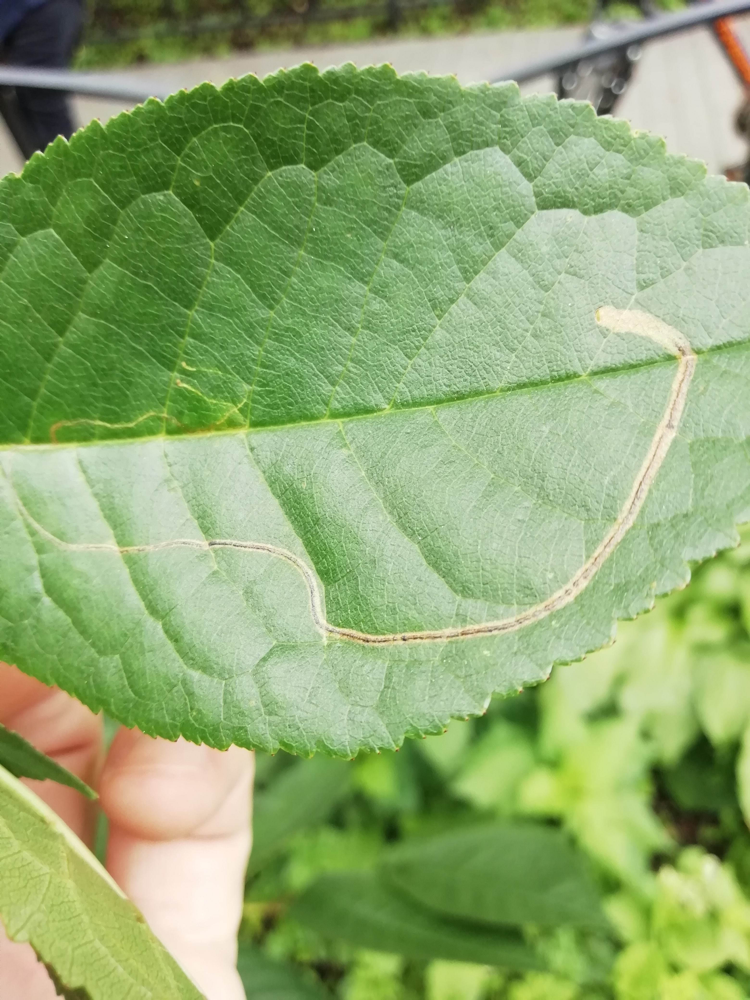

4
0


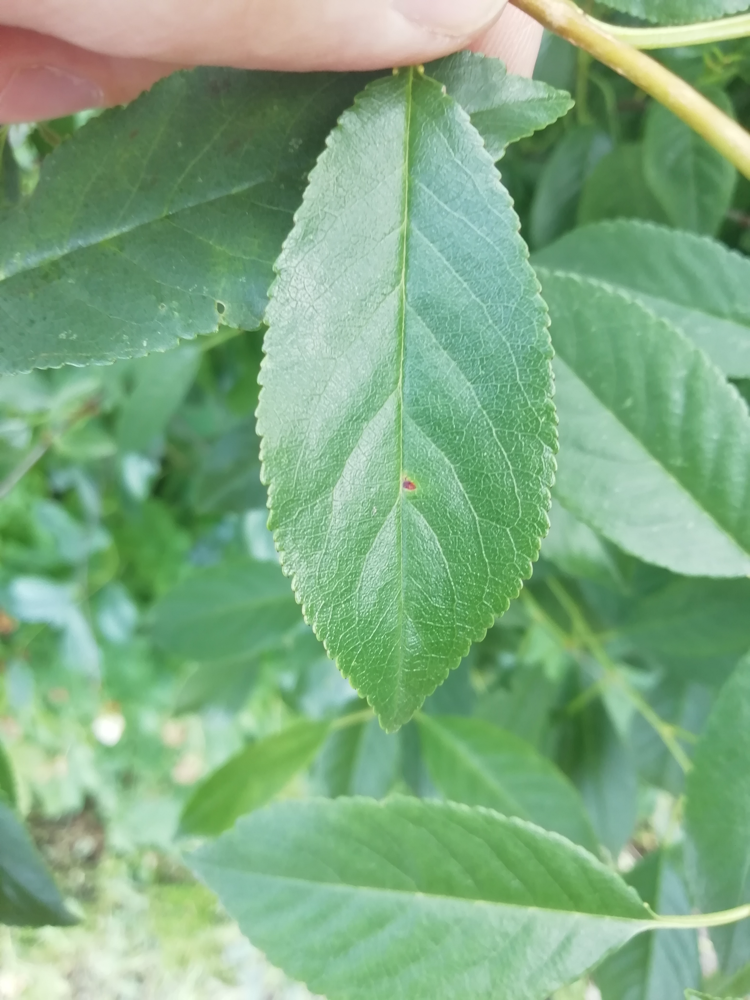

1
1


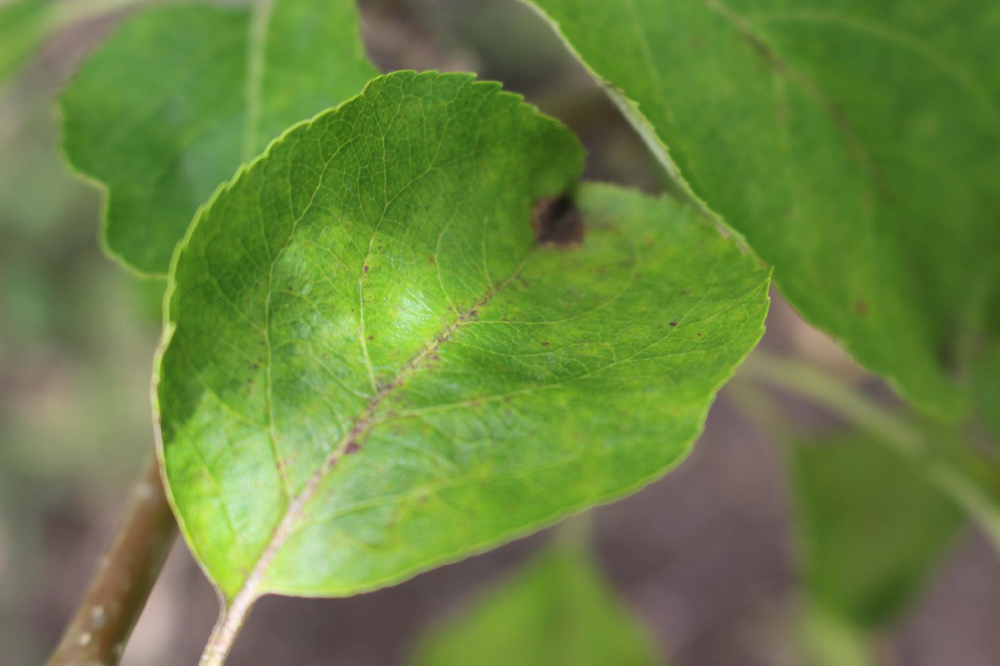

1
1


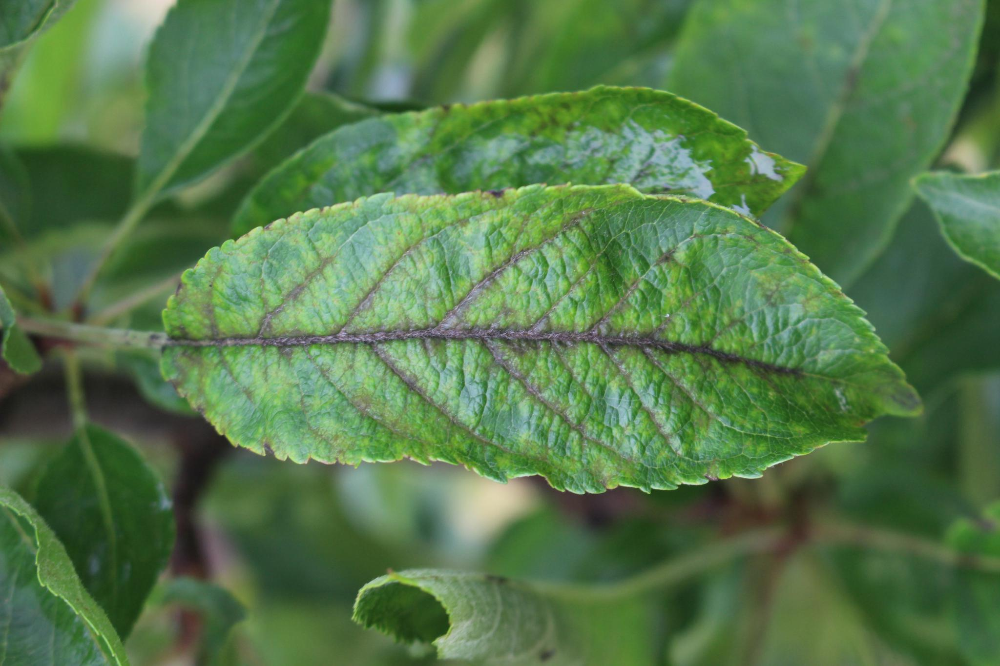

6
1


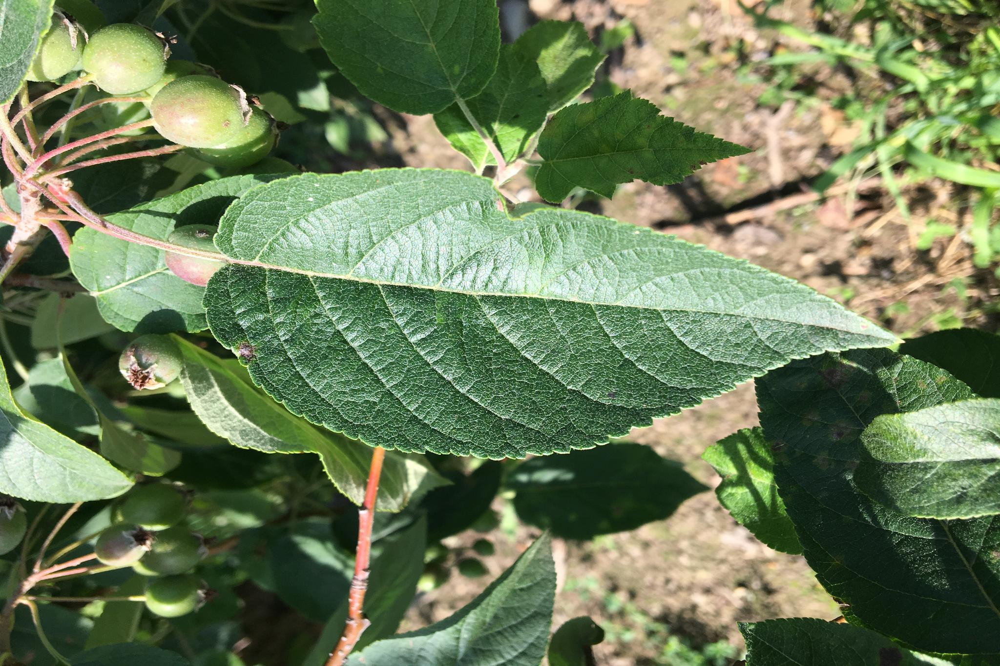

3
0


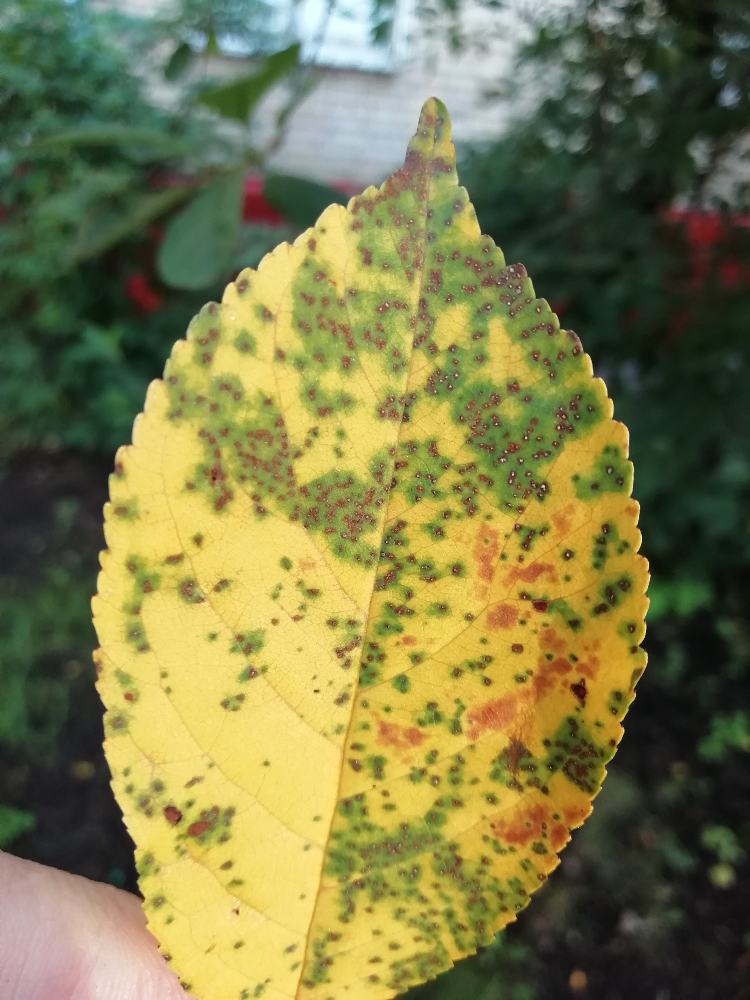

1
1


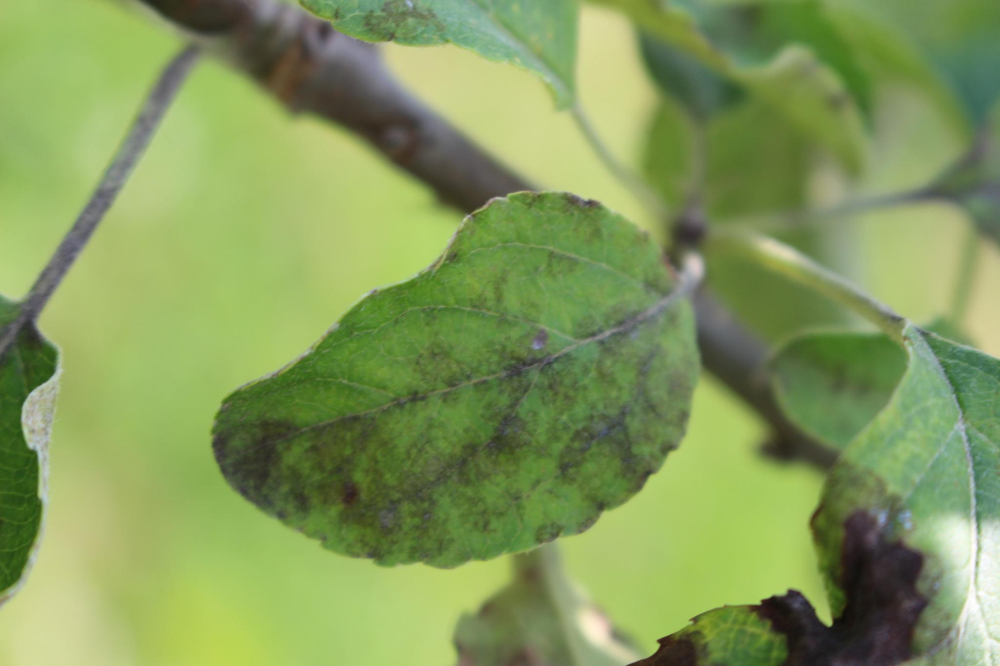

5
1


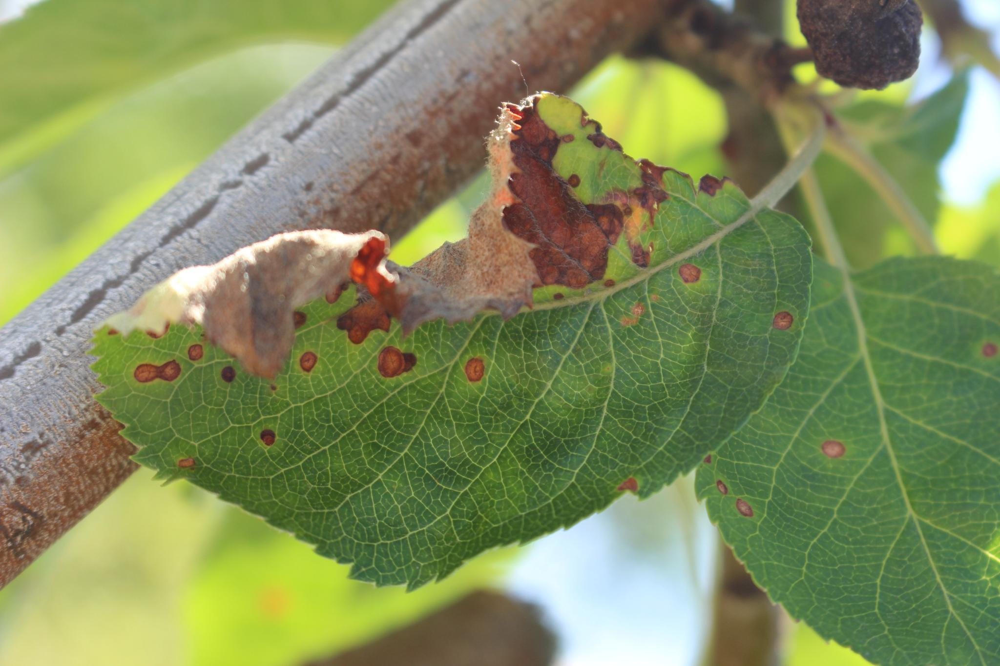

1
1


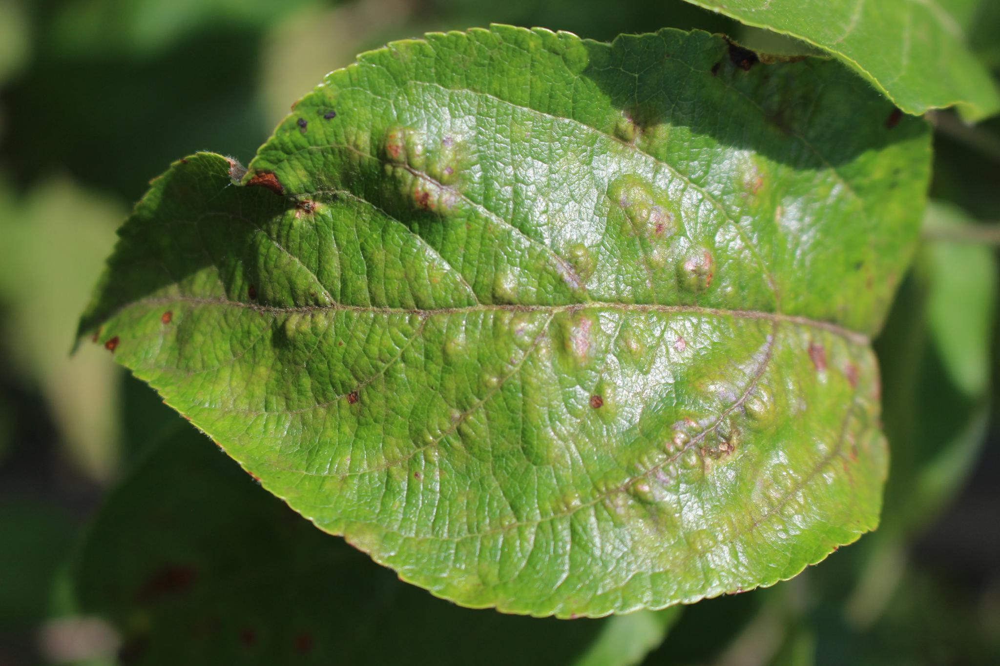

6
1


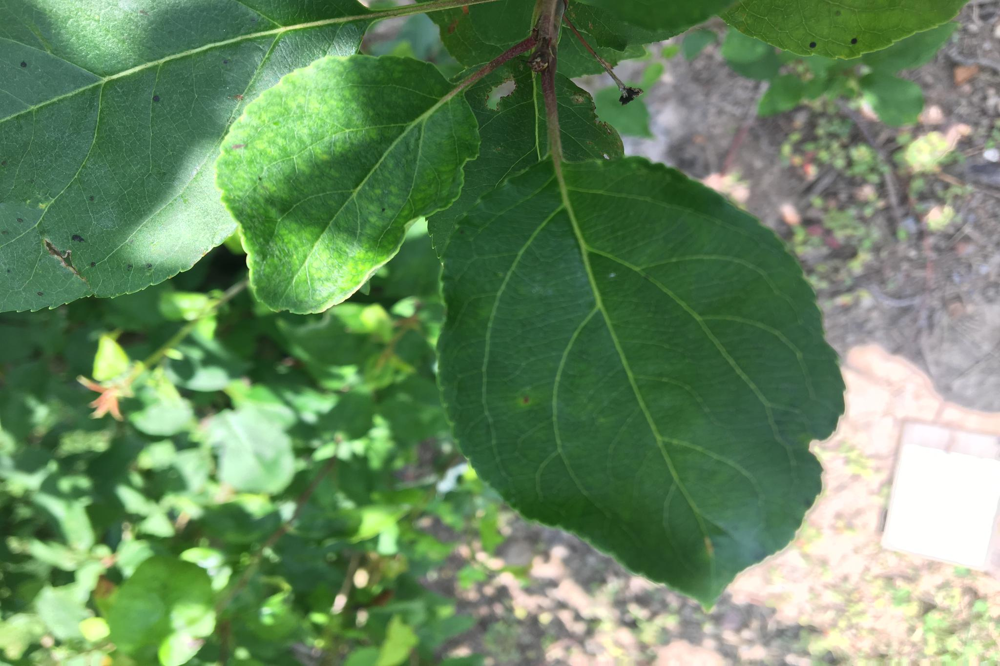

In [79]:
for image_features in parsed_image_dataset.take(10):
    image_raw = image_features['image_raw'].numpy()
    print(image_features['label'].numpy())
    print(image_features['plant_type'].numpy())
    display.display(display.Image(data=image_raw, height=250, width=250))